<a href="https://colab.research.google.com/github/ekambaranath/CNN/blob/main/brain_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#WHAT THIS NOTEBOOK IS ALL ABOUT?

##The whole notebook is divided into two parts :
1. Image Classification (i.e whether the Image has tumor or not)

CONTENTS:

1. IMPORTING LIBRARIES AND DATASETS
2. DATA VISUALIZATION
3. CREATING TRAIN,VAL AND TEST DATASET
4. TRAINING THE MODEL
5. EVALUATION

2. Image Segmentation (i.e. If the image has tumor, then predict the region where the tumor is present, basically we need to map all the pixel values to a label of 0, or 1, that's it)

CONTENTS:

6. CREATING A DATASET OF MASKED ELEMENTS
7. CREATING A CUSTOM DATA GENERATOR
8. CREATING A RESNET BLOCK
9. TRAINING SEGMENTATION MODEL
10. SEGMENTATION MODEL EVALUATION
11. PREDICTION USING SEGMENTATION MODEL

#A note from myside:

The notebook will be almost similar to the one that is mentioned above, however I wanted to practice the problems of Image Segmentation and Classification, so thought of making a notebook, (sought of tutorial, so that I can revisit this notebook, as and when required), all the credits goes to the author [Brain MRI detection | Segmentation | ResUNet](https://www.kaggle.com/anantgupt/brain-mri-detection-segmentation-resunet)

thanks and

Enjoy the notebook :)


#a. Image Classification
#ABOUT:

This section of the Notebook deals with the Image Classification part of the data, which means that, we need to input a raw image, and devise an algorithm, and then predict the output, based on the Image

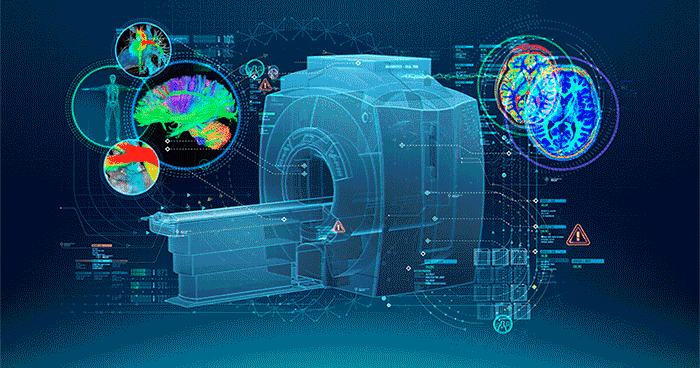


This section would contain:
1. Importing the Libraries and Dataset
2. Visualization
3.Creating Train, Val and Test dataset for providing the input to the model
4. Training the Model
5. Evaluating the Model


#1. IMPORTING LIBRARIES AND DATASETS
So, in this section, we would prepare our libraries and have a look at the dataset, some of the libraries that we would be requiring are the visualization libraries, image manipulation libraries and ofcourse, Tensorflow :), let us get started!!!

In [2]:
import numpy as np                   # For manipulation
import pandas as pd                  # For manipulation
import matplotlib.pyplot as plt      # For Data Visualization
import seaborn as sns                # For Data Visualization
import zipfile                       # For Extracting zipfile
import cv2                           # For Image Manipulation
from skimage import io               # For Image Manipulation

import tensorflow as tf
from tensorflow.python.keras import Sequential # For creating model
from tensorflow.keras import optimizers,layers # For creating layers, optimizers
from tensorflow.keras.layers import *          # For creating the operations, eg Conv2D, MaxPool2D,etc
from tensorflow.keras.models import Model       # For creating model
from tensorflow.keras.initializers import glorot_uniform # Intialization of the weights
from tensorflow.keras.utils import plot_model   # Plotting the Model
from tensorflow.keras.callbacks import ReduceLROnPlateau,EarlyStopping,ModelCheckpoint,LearningRateScheduler # The Modules itself signifies the meaning
import tensorflow.keras.backend as K

import random                                   # For generating random numbers
import glob                                     # Similar to os
from sklearn.preprocessing import StandardScaler,normalize # For rescaling and normalizing the image
from IPython.display import display             # Displaying the images

In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
import zipfile

zip_path = '/content/drive/MyDrive/Brain/archive.zip'
csv_inside_zip = 'lgg-mri-segmentation/kaggle_3m/data.csv'

with zipfile.ZipFile(zip_path) as z:
    with z.open(csv_inside_zip) as f:
        data = pd.read_csv(f)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [5]:
data.head(10)

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
5,TCGA_CS_5395,2.0,4.0,2,2.0,NaN,3.0,2,3.0,1.0,1.0,3.0,5.0,2.0,43.0,2.0,NaN,1.0
6,TCGA_CS_5396,3.0,3.0,2,3.0,2.0,2.0,3,3.0,2.0,1.0,3.0,2.0,1.0,53.0,3.0,2.0,0.0
7,TCGA_CS_5397,NaN,4.0,1,2.0,3.0,3.0,2,1.0,2.0,1.0,1.0,6.0,1.0,54.0,3.0,2.0,1.0
8,TCGA_CS_6186,2.0,4.0,1,2.0,1.0,3.0,2,2.0,2.0,1.0,3.0,2.0,2.0,58.0,3.0,2.0,1.0
9,TCGA_CS_6188,2.0,4.0,3,2.0,3.0,3.0,2,1.0,2.0,1.0,3.0,6.0,2.0,48.0,3.0,2.0,0.0


In [6]:
import zipfile
zip_path = '/content/drive/MyDrive/Brain/archive.zip'
extract_to = '/kaggle/working/brain_extracted'

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(extract_to)

print("Extracted to:", extract_to)


Extracted to: /kaggle/working/brain_extracted


In [7]:
import os

for root, dirs, files in os.walk(extract_to):
    print(root, dirs[:5], files[:5])
    break


/kaggle/working/brain_extracted ['kaggle_3m', 'lgg-mri-segmentation'] []


In [11]:
import zipfile

zip_path = "/content/drive/MyDrive/Brain/archive.zip"
extract_to = "/content/drive/MyDrive/Brain/"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print("Extraction complete")


Extraction complete


In [12]:
base_path = "/content/drive/MyDrive/Brain/lgg-mri-segmentation/kaggle_3m/"

data_map = []

# Loop through each patient directory
for sub_dir_path in glob.glob(base_path + '*'):

    # Skip files like README.md, data.csv
    if not os.path.isdir(sub_dir_path):
        continue

    patient_id = os.path.basename(sub_dir_path)

    # Loop through files inside patient folder
    for filename in os.listdir(sub_dir_path):
        full_path = os.path.join(sub_dir_path, filename)
        data_map.append([patient_id, full_path])

# Create DataFrame
df = pd.DataFrame(data_map, columns=['patient_id', 'path'])
df.head()

,patient_id,path
0,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...
1,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...
2,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...
3,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...
4,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...


In [17]:
import os
import random

# Separate images and masks
df_imgs = df[~df['path'].str.contains('mask')]
df_masks = df[df['path'].str.contains('mask')]

def extract_index(path):
    """
    Extracts final slice number even for mask filenames.
    Works for:
      image:  file_123.png
      mask :  file_123_mask.png
    """
    name = os.path.basename(path)
    name_no_ext = os.path.splitext(name)[0]      # Remove .png/.tif

    # If mask file → remove the '_mask' suffix
    if name_no_ext.endswith("_mask"):
        name_no_ext = name_no_ext.replace("_mask", "")

    # Now take the last numeric part
    number = name_no_ext.split('_')[-1]
    return int(number)

# Sort properly
imgs = sorted(df_imgs['path'].values, key=extract_index)
masks = sorted(df_masks['path'].values, key=extract_index)

# Random index
idx = random.randint(0, len(imgs) - 1)

print("Image:", imgs[idx])
print("Mask :", masks[idx])


Image: /content/drive/MyDrive/Brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7299_19910417/TCGA_DU_7299_19910417_5.tif
Mask : /content/drive/MyDrive/Brain/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7299_19910417/TCGA_DU_7299_19910417_5_mask.tif


In [18]:
brain_df = pd.DataFrame({'patient_id':df_imgs.patient_id.values,
                    'image_path':imgs,'mask_path':masks})         # Creating a dataframe containing the id, the image path and the mask path

def pos_neg_diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))                         # This is for determining whether tumor exists or not
    if value>0:
        return 1
    else:
        return 0
brain_df['mask'] = brain_df['mask_path'].apply(lambda x:pos_neg_diagnosis(x))
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0
1,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0
2,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0
3,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0
4,TCGA_CS_4941_19960909,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0
...,...,...,...,...
3924,TCGA_HT_A61B_19991127,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0
3925,TCGA_HT_A61B_19991127,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0
3926,TCGA_HT_A61B_19991127,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0
3927,TCGA_HT_A61B_19991127,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0


#2. DATA VISUALIZATION


In this section, we would take a look at the images and their mask :)

In [19]:
brain_df['mask'].value_counts()

,count
mask,
0,2556
1,1373


In [20]:
import plotly.graph_objects as go
fig = go.Figure([go.Bar(x=brain_df['mask'].value_counts().index,
                       y = brain_df['mask'].value_counts(),
                       width = [.4,.4])])

fig.update_traces(marker_color='rgb(0,20,225)',marker_line_color='rgb(0,2,10)',
                marker_line_width = 4,opacity=0.4)
fig.update_layout(title_text = 'Mask Count Plot',
                width = 700,height=550,yaxis=dict(title_text='Count',
                                    tickmode='array',titlefont=dict(size=20)))

fig.update_yaxes(automargin=True)
fig.show()

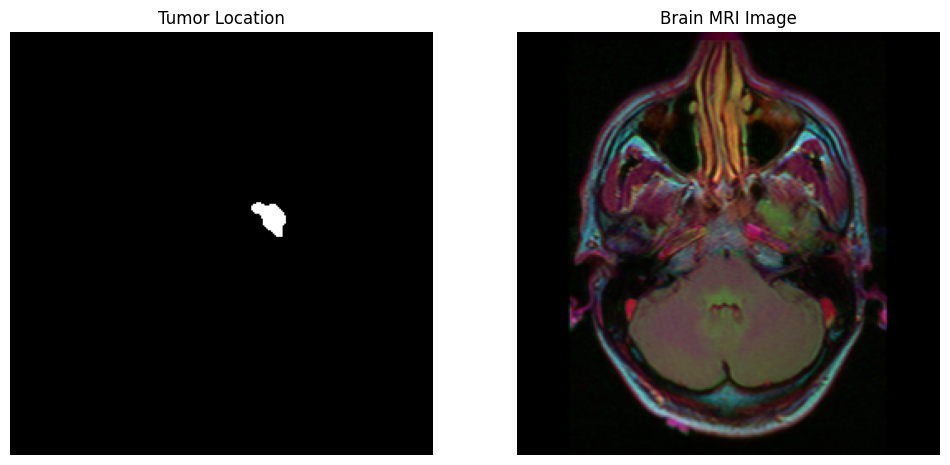

In [21]:
# Printing the Tumor Image
for i in range(len(brain_df)):
    if cv2.imread(brain_df['mask_path'][i]).max()>0:
        break

plt.figure(figsize=(12,8))
plt.subplot(121)
plt.imshow(cv2.imread(brain_df['mask_path'][i]));
plt.title('Tumor Location')
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.imread(brain_df['image_path'][i]));
plt.title("Brain MRI Image")
plt.axis('off')
plt.show()

In [22]:
cv2.imread(brain_df['mask_path'][i]).max(),cv2.imread(brain_df['mask_path'][i]).min()

(np.uint8(255), np.uint8(0))

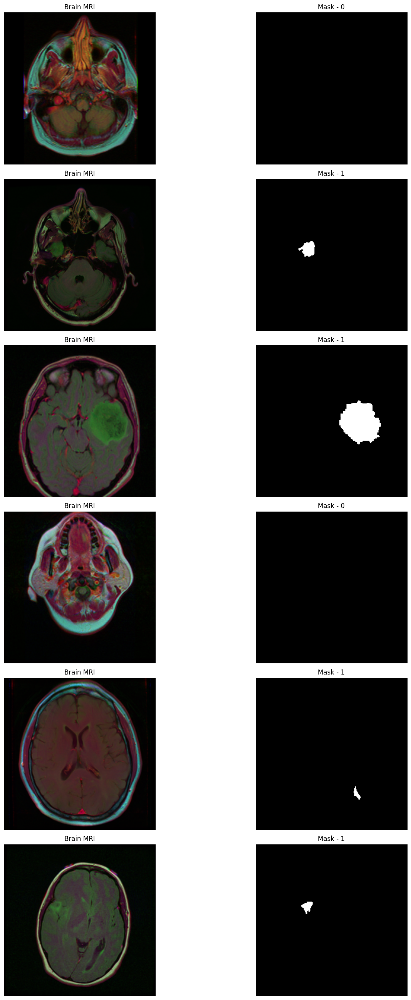

In [23]:
fig,axs = plt.subplots(6,2,figsize=(16,26))
count = 0
for x in range(6):
    i = random.randint(0,len(brain_df))
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(cv2.imread(brain_df['image_path'][i]))
    axs[count][1].title.set_text("Mask - "+str(brain_df['mask'][i]))
    axs[count][1].imshow(cv2.imread(brain_df['mask_path'][i]))
    axs[count][0].axis('off')
    axs[count][1].axis('off')
    count+=1
fig.tight_layout()

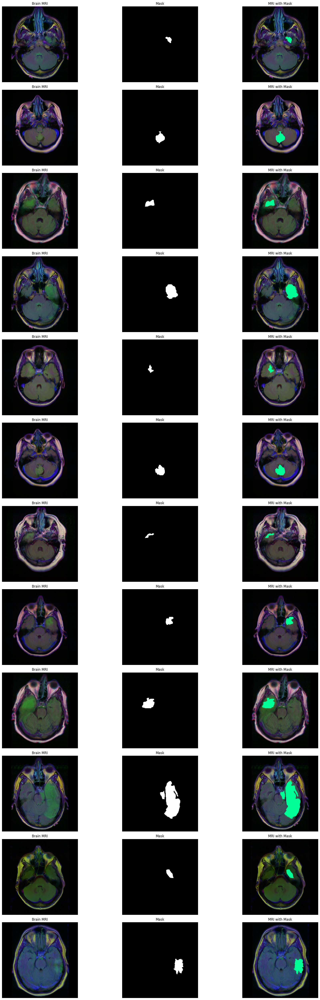

In [24]:
count = 0
i = 0
fig,axs= plt.subplots(12,3,figsize=(20,50))
for mask in brain_df['mask']:
    if(mask==1):
        img = io.imread(brain_df['image_path'][i])
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].imshow(img)

        mask = io.imread(brain_df['mask_path'][i])
        axs[count][1].title.set_text('Mask')
        axs[count][1].imshow(mask,cmap ='gray')
        img[mask==255]=(0,255,150)
        axs[count][2].title.set_text('MRI with Mask')
        axs[count][2].imshow(img)
        axs[count][0].axis('off')
        axs[count][1].axis('off')
        axs[count][2].axis('off')
        count+=1
    i+=1
    if(count==12):
        break
fig.tight_layout()

#3. CREATING TRAIN, VAL AND TEST DATASET


In this section, we would be creating the dataset, so that it could be directly fed into the model :)

In [25]:
brain_df_train = brain_df.drop(columns=['patient_id'])
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [26]:
from sklearn.model_selection import train_test_split
train,test = train_test_split(brain_df_train,test_size=0.15) # Splitting the data

In [28]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rescale=1./255,validation_split=0.1)
# Creating dataset
train_generator = datagen.flow_from_dataframe(train,directory = './',
                x_col = 'image_path',y_col='mask',subset='training',class_mode='categorical',
                                             batch_size=16,shuffle=True,target_size=(256,256))
valid_generator = datagen.flow_from_dataframe(train,directory='./',
                                x_col = 'image_path',y_col = 'mask',
                                             subset='validation',class_mode='categorical',batch_size=16,shuffle=True,target_size=(256,256))
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(test,directory='./',x_col='image_path',y_col = 'mask',class_mode='categorical',batch_size=16,shuffle=False,target_size=(256,256))

Found 3006 validated image filenames belonging to 2 classes.
Found 333 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


#4. CREATING AND TRAINING THE MODEL
We would be using ResNet 50, for our classification task

In [29]:
from tensorflow.keras.applications.resnet50 import ResNet50
clf_model = ResNet50(weights='imagenet',include_top=False,input_tensor = Input(shape=(256,256,3)))
clf_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [30]:
head = clf_model.output
head = AveragePooling2D(pool_size=(4,4))(head)
head = Flatten(name='Flatten')(head)
head = Dense(256,activation='relu')(head)
head = Dropout(0.3)(head)
head = Dense(256,activation='relu')(head)
head = Dropout(0.3)(head)
head = Dense(2,activation='softmax')(head)

model = Model(clf_model.input,head)
model.compile(loss='categorical_crossentropy',
             optimizer='adam',metrics=['accuracy'])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 25,751,426 (98.23 MB)

 Trainable params: 25,698,306 (98.03 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [32]:
early_stopping= EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=15) # Early stopping, if our validation loss does not improve
check_pointer = ModelCheckpoint(
    filepath='clf-resnet-weights.keras',
    verbose=1,
    save_best_only=True
)

reduce_lr = ReduceLROnPlateau(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta = 0.0001,factor=0.2) # Reduce the Learning Rate, by monitori
callbacks = [check_pointer,early_stopping,reduce_lr]

In [33]:
h = model.fit(train_generator,steps_per_epoch = train_generator.n//train_generator.batch_size,
                        epochs=100,validation_data=valid_generator,validation_steps = valid_generator.n//valid_generator.batch_size,
                             callbacks = [check_pointer,early_stopping])

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/100
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step - accuracy: 0.7182 - loss: 0.9281
Epoch 1: val_loss improved from inf to 0.85153, saving model to clf-resnet-weights.keras
187/187 ━━━━━━━━━━━━━━━━━━━━ 140s 408ms/step - accuracy: 0.7185 - loss: 0.9267 - val_accuracy: 0.6062 - val_loss: 0.8515
Epoch 2/100
  1/187 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - accuracy: 0.8750 - loss: 0.2846

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.




Epoch 2: val_loss improved from 0.85153 to 0.72404, saving model to clf-resnet-weights.keras
187/187 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.8750 - loss: 0.2846 - val_accuracy: 0.5875 - val_loss: 0.7240
Epoch 3/100
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.8270 - loss: 0.4108
Epoch 3: val_loss did not improve from 0.72404
187/187 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8269 - loss: 0.4111 - val_accuracy: 0.5938 - val_loss: 1.8608
Epoch 4/100
  1/187 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.7500 - loss: 0.3806
Epoch 4: val_loss did not improve from 0.72404
187/187 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.7500 - loss: 0.3806 - val_accuracy: 0.6031 - val_loss: 2.0126
Epoch 5/100
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - accuracy: 0.8028 - loss: 0.4261
Epoch 5: val_loss improved from 0.72404 to 0.67444, saving model to clf-resnet-weights.keras
187/187 ━━━━━━━━━━━━━━━━━━━━ 45s 238ms/step - accuracy: 0.8029 - loss: 0.4260 - val_accuracy: 0

In [34]:
# Saving the Model architecture in json file
model_json = model.to_json()
with open('clf-resnet-model.json','w') as json_file:
    json_file.write(model_json)
model.save('clf-brain.hdf5')

In [35]:
h.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

#5. EVALUATION

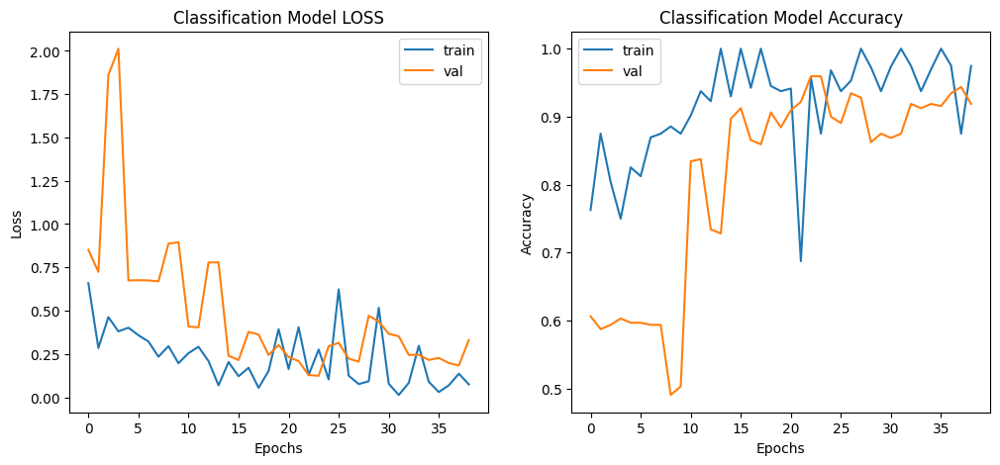

In [36]:
plt.figure(figsize=(12,5))
plt.subplot(121)
plt.plot(h.history['loss'])
plt.plot(h.history['val_loss'])
plt.title("Classification Model LOSS")
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend(['train','val'])

plt.subplot(122)
plt.plot(h.history['accuracy'])
plt.plot(h.history['val_accuracy'])
plt.title("Classification Model Accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epochs")
plt.legend(['train','val'])
plt.show()

In [37]:
_,acc = model.evaluate(test_generator)
print("Test Accuracy :  {} %".format(acc*100))

37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 185ms/step - accuracy: 0.9211 - loss: 0.5695
Test Accuracy :  93.55932474136353 %


37/37 ━━━━━━━━━━━━━━━━━━━━ 15s 189ms/step
0.9355932203389831
              precision    recall  f1-score   support

           0       0.91      0.99      0.95       373
           1       0.99      0.83      0.91       217

    accuracy                           0.94       590
   macro avg       0.95      0.91      0.93       590
weighted avg       0.94      0.94      0.93       590



<Axes: >

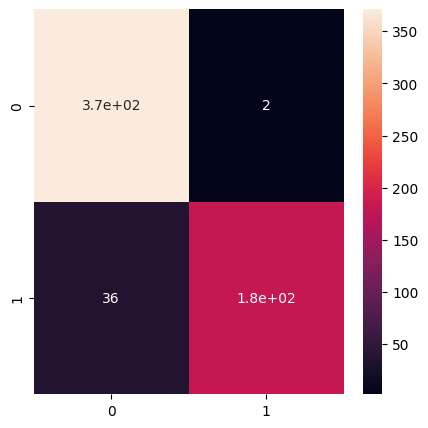

In [38]:
prediction = model.predict(test_generator)
pred = np.argmax(prediction,axis=1)
original = np.asarray(test['mask']).astype('int')

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
accuracy = accuracy_score(original,pred)
print(accuracy)

cm = confusion_matrix(original,pred)
report = classification_report(original,pred,labels=[0,1])
print(report)
plt.figure(figsize=(5,5))
sns.heatmap(cm,annot=True)

So, we can see that our model has perfomed well, now let us move to the Segmentation part
#b. Building a Segmentation Model to Localize Tumour

#6. CREATING A DATASET OF MASKED ELEMENTS

In [39]:
brain_df_mask = brain_df[brain_df['mask']==1]
brain_df_mask.shape

(1373, 4)

In [40]:
X_train,X_val = train_test_split(brain_df_mask,test_size=0.15)
X_test,X_val = train_test_split(X_val,test_size=0.5)

print("Train Size is {}, validation size is {} & test size is {}".format(len(X_train),len(X_val),len(X_test)))

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask = list(X_val.mask_path)

Train Size is 1167, validation size is 103 & test size is 103


#7. CREATING A CUSTOM DATA GENERATOR


In [42]:
import numpy as np
import cv2
from skimage import io
import tensorflow as tf


class DataGenerator(tf.keras.utils.Sequence):

  def __init__(self, ids , mask, image_dir = './', batch_size = 16,
               img_h = 256, img_w = 256, shuffle = True):

    self.ids = ids
    self.mask = mask
    self.image_dir = image_dir
    self.batch_size = batch_size
    self.img_h = img_h
    self.img_w = img_w
    self.shuffle = shuffle
    self.on_epoch_end()

  def __len__(self):
    return int(np.floor(len(self.ids)) / self.batch_size)

  def __getitem__(self, index):

    indexes = self.indexes[index * self.batch_size : (index+1) * self.batch_size]

    list_ids = [self.ids[i] for i in indexes]
    list_mask = [self.mask[i] for i in indexes]

    X, y = self.__data_generation(list_ids, list_mask)
    return X, y

  def on_epoch_end(self):

    self.indexes = np.arange(len(self.ids))
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, list_ids, list_mask):

    X = np.empty((self.batch_size, self.img_h, self.img_w, 3), dtype=np.float32)
    y = np.empty((self.batch_size, self.img_h, self.img_w, 1), dtype=np.float32)

    for i in range(len(list_ids)):

      img_path = str(list_ids[i])
      mask_path = str(list_mask[i])

      img = io.imread(img_path)
      mask = io.imread(mask_path)

      # cv2.resize takes (width, height)
      img = cv2.resize(img, (self.img_w, self.img_h))
      mask = cv2.resize(mask, (self.img_w, self.img_h))

      img = img.astype(np.float32)
      mask = mask.astype(np.float32)

      # safe std normalization
      img = (img - img.mean()) / (img.std() + 1e-8)
      mask = (mask - mask.mean()) / (mask.std() + 1e-8)

      X[i] = img
      y[i] = np.expand_dims(mask, axis=2)

    y = (y > 0).astype(np.float32)
    return X, y


train_data = DataGenerator(train_ids, train_mask)
val_data = DataGenerator(val_ids, val_mask)


#8. CREATING A RESNET BLOCK

In [43]:
def resblock(X,f):
    X_copy = X
    X  =Conv2D(f,kernel_size=(1,1),kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)

    X = Conv2D(f,kernel_size=(3,3),padding='same',kernel_initializer='he_normal')(X)
    X = BatchNormalization()(X)

    X_copy = Conv2D(f,kernel_size=(1,1),kernel_initializer='he_normal')(X_copy)
    X_copy = BatchNormalization()(X_copy)

    X = Add()([X,X_copy])
    X =Activation('relu')(X)

    return X

def upsample_concat(x,skip):
    X = UpSampling2D((2,2))(x)
    merge = Concatenate()([X,skip])
    return merge

In [44]:
input_shape = (256,256,3)
X_input = Input(input_shape)

# Stage 1
conv_1 = Conv2D(16,3,activation='relu',padding='same',kernel_initializer='he_normal')(X_input)
conv_1 =BatchNormalization()(conv_1)
conv_1 = Conv2D(16,3,activation='relu',padding='same',kernel_initializer='he_normal')(conv_1)
conv_1 = BatchNormalization()(conv_1)
pool_1 = MaxPool2D((2,2))(conv_1)

# Stage 2
conv_2 = resblock(pool_1,32)
pool_2 = MaxPool2D((2,2))(conv_2)

# Stage 3
conv_3 = resblock(pool_2,64)
pool_3 = MaxPool2D((2,2))(conv_3)

# Stage 4
conv_4 = resblock(pool_3,128)
pool_4 = MaxPool2D((2,2))(conv_4)

# Stage 5 (bottle neck)
conv_5 = resblock(pool_4,256)

# Upsample Stage 1
up_1 = upsample_concat(conv_5,conv_4)
up_1 = resblock(up_1,128)

# Upsample Stage 2
up_2 = upsample_concat(up_1,conv_3)
up_2 = resblock(up_2,64)

# Upsample Stage 3
up_3 = upsample_concat(up_2,conv_2)
up_3 = resblock(up_3,32)

# Upsample stage 4
up_4 = upsample_concat(up_3,conv_1)
up_4 = resblock(up_4,16)

out = Conv2D(1,(1,1),kernel_initializer='he_normal',padding='same',activation='sigmoid')(up_4)
seg_model = Model(X_input,out)
seg_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        448 │ input_layer_1[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │         64 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      2,320 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │         64 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │        544 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │      9,248 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │        544 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 128, 128,  │          0 │ add[0][0]         │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │      2,112 │ max_pooling2d_1[

 Total params: 1,210,513 (4.62 MB)

 Trainable params: 1,206,129 (4.60 MB)

 Non-trainable params: 4,384 (17.12 KB)

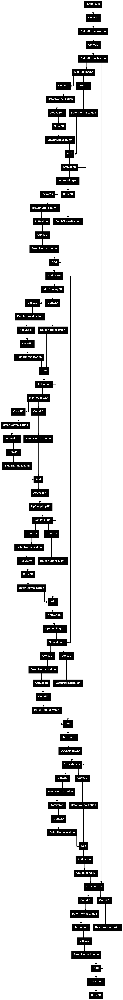

In [45]:
tf.keras.utils.plot_model(seg_model,to_file='seg_model.png')

#9. TRAINING SEGMENTATION MODEL

In [46]:
from keras.losses import binary_crossentropy

epsilon = 1e-5
smooth = 1

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

In [48]:
# compiling model and callbacks functions
adam = tf.keras.optimizers.Adam(learning_rate=0.05, epsilon=0.1)

seg_model.compile(
    optimizer=adam,
    loss=focal_tversky,
    metrics=[tversky]
)

# callbacks
earlystopping = EarlyStopping(
    monitor='val_loss',
    mode='min',
    verbose=1,
    patience=20
)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(
    filepath="ResUNet-segModel-weights.keras",
    verbose=1,
    save_best_only=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    mode='min',
    verbose=1,
    patience=10,
    min_delta=0.0001,
    factor=0.2
)


In [49]:
h = seg_model.fit(train_data,epochs = 100,validation_data = val_data,callbacks=[checkpointer,early_stopping,reduce_lr])

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.9014 - tversky: 0.1291

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.




Epoch 1: val_loss improved from inf to 0.88291, saving model to ResUNet-segModel-weights.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 54s 286ms/step - loss: 0.9011 - tversky: 0.1295 - val_loss: 0.8829 - val_tversky: 0.1530 - learning_rate: 0.0500
Epoch 2/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - loss: 0.7801 - tversky: 0.2803
Epoch 2: val_loss improved from 0.88291 to 0.64652, saving model to ResUNet-segModel-weights.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 17s 228ms/step - loss: 0.7790 - tversky: 0.2816 - val_loss: 0.6465 - val_tversky: 0.4406 - learning_rate: 0.0500
Epoch 3/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - loss: 0.4410 - tversky: 0.6623
Epoch 3: val_loss improved from 0.64652 to 0.45030, saving model to ResUNet-segModel-weights.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.4408 - tversky: 0.6626 - val_loss: 0.4503 - val_tversky: 0.6544 - learning_rate: 0.0500
Epoch 4/100
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - loss: 0.3855 - tversky: 0.7171
Epoch 4: val_loss did not im

In [50]:
# saving model achitecture in json file
seg_model_json = seg_model.to_json()
with open("ResUNet-seg-model.json", "w") as json_file:
    json_file.write(seg_model_json)
seg_model.save('seg_model_brain.hdf5')

#10. SEGMENTATION MODEL EVALUATION

In [51]:
h.history.keys()

dict_keys(['loss', 'tversky', 'val_loss', 'val_tversky', 'learning_rate'])

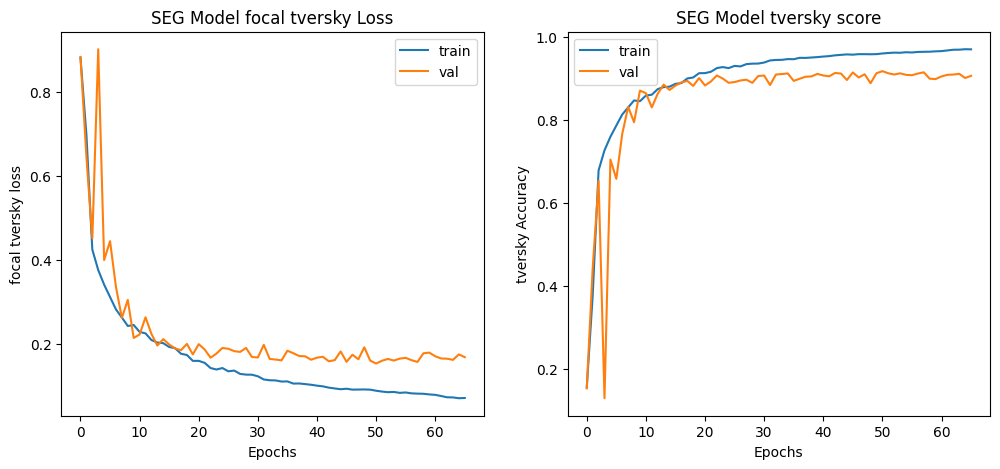

In [52]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("SEG Model focal tversky Loss");
plt.ylabel("focal tversky loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['tversky']);
plt.plot(h.history['val_tversky']);
plt.title("SEG Model tversky score");
plt.ylabel("tversky Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

In [53]:
test_ids = list(X_test.image_path)
test_mask = list(X_test.mask_path)
test_data = DataGenerator(test_ids, test_mask)
_, tv = seg_model.evaluate(test_data)
print("Segmentation tversky is {:.2f}%".format(tv*100))

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step - loss: 0.1850 - tversky: 0.8943
Segmentation tversky is 89.38%


#11. PREDICTION OF THE SEGMENTATION MODEL

In [54]:
def prediction(test,model,model_seg):
    mask,image_id,has_mask = [],[],[]

    for i in test.image_path:
        img = io.imread(i)
        img=img*1./255.0
        img = cv2.resize(img,(256,256))
        img = np.array(img,dtype=np.float64)
        img = np.reshape(img,(1,256,256,3))

        is_defect = model.predict(img)

        if np.argmax(is_defect) ==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append("No Mask :)")
            continue

        X = np.empty((1,256,256,3))
        img = io.imread(i)
        img = cv2.resize(img,(256,256))
        img = np.array(img,dtype=np.float64)
        img-=img.mean()
        img/=img.std()
        X[0,] = img
        predict = model_seg.predict(X)
        if predict.round().astype(int).sum()==0:
            image_id.append(i)
            has_mask.append(0)
            mask.append("No Mask :)")
        else:
            image_id.append(i)
            has_mask.append(1)
            mask.append(predict)
    return pd.DataFrame({"image_path":image_id,'predicted_mask':mask,'has_mask':has_mask})

In [55]:
df_pred = prediction(test,model,seg_model)
df_pred

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━

,image_path,predicted_mask,has_mask
0,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,No Mask :),0
1,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,"[[[[3.4562714e-07], [3.6012239e-07], [3.563653...",1
2,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,No Mask :),0
3,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,"[[[[6.463546e-07], [1.0421484e-06], [1.1951013...",1
4,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,"[[[[1.318198e-06], [1.6948587e-06], [1.1334105...",1
...,...,...,...
585,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,No Mask :),0
586,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,No Mask :),0
587,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,No Mask :),0
588,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,"[[[[3.995794e-07], [4.942397e-07], [5.05855e-0...",1


In [56]:
df_pred = test.merge(df_pred,on='image_path')
df_pred.head(10)

,image_path,mask_path,mask,predicted_mask,has_mask
0,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0,No Mask :),0
1,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,1,"[[[[3.4562714e-07], [3.6012239e-07], [3.563653...",1
2,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,1,No Mask :),0
3,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,1,"[[[[6.463546e-07], [1.0421484e-06], [1.1951013...",1
4,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,1,"[[[[1.318198e-06], [1.6948587e-06], [1.1334105...",1
5,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,1,"[[[[3.453596e-07], [3.9174734e-07], [3.629611e...",1
6,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0,No Mask :),0
7,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0,No Mask :),0
8,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,1,"[[[[4.2818724e-07], [5.857711e-07], [6.3931284...",1
9,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,/content/drive/MyDrive/Brain/lgg-mri-segmentat...,0,No Mask :),0


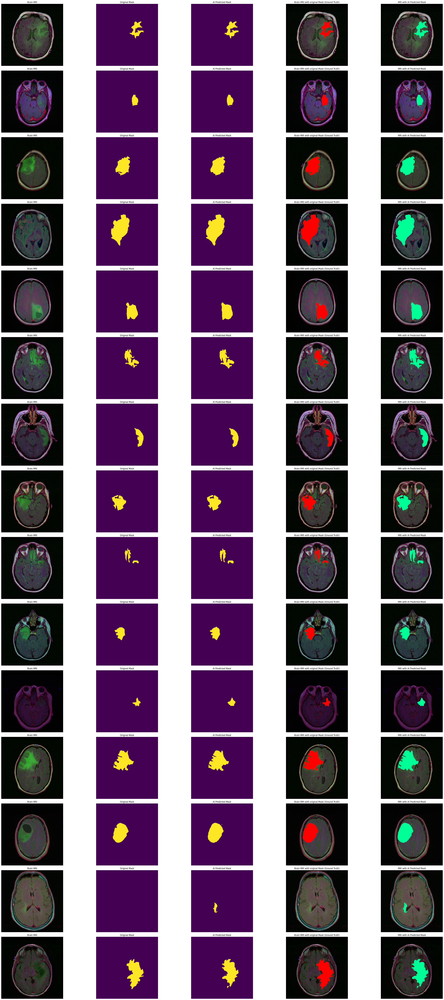

In [57]:
count = 0
fig,axs = plt.subplots(15,5,figsize=(40,80))
for i in range(len(df_pred)):
    if df_pred.has_mask[i]==1 and count<15:
        img = io.imread(df_pred.image_path[i])
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        axs[count][0].imshow(img)
        axs[count][0].title.set_text("Brain MRI")
        axs[count][0].axis('off')

        mask = io.imread(df_pred.mask_path[i])
        axs[count][1].imshow(mask)
        axs[count][1].title.set_text("Original Mask")
        axs[count][1].axis('off')

        pred = np.array(df_pred.predicted_mask[i]).squeeze().round()
        axs[count][2].imshow(pred)
        axs[count][2].title.set_text("AI Predicted Mask")
        axs[count][2].axis('off')

        img[mask==255] =(255,0,0)
        axs[count][3].imshow(img)
        axs[count][3].title.set_text("Brain MRI with original Mask (Ground Truth)")
        axs[count][3].axis('off')

        img_ = io.imread(df_pred.image_path[i])
        img_ = cv2.cvtColor(img_,cv2.COLOR_BGR2RGB)
        img_[pred==1]= (0,255,150)
        axs[count][4].imshow(img_)
        axs[count][4].title.set_text("MRI with AI Predicted Mask")
        axs[count][4].axis('off')
        count+=1
    if(count==15):
        break
fig.tight_layout()